In [ ]:
!pip install kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"asmaaelsayedmohamed","key":"fabd576c5add87729b3636001f49af38"}'}

In [ ]:
# إنشاء المجلد المخفي .kaggle إذا لم يكن موجودًا
!mkdir -p ~/.kaggle

# نقل ملف kaggle.json إلى المجلد .kaggle
!mv kaggle.json ~/.kaggle/

# ضبط الأذونات للملف لتجنب مشاكل الأذونات
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
# تحميل قائمة مجموعات البيانات للتأكد أن الاتصال يعمل
!kaggle datasets list


ref                                                          title                                           size  lastUpdated          downloadCount  voteCount  usabilityRating  
-----------------------------------------------------------  ---------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
valakhorasani/mobile-device-usage-and-user-behavior-dataset  Mobile Device Usage and User Behavior Dataset   11KB  2024-09-28 20:21:12          11658        222  1.0              
satvshr/top-4-used-car-sales-datasets-combined               Top 4 Used Car Sales Datasets Combined         446KB  2024-10-21 13:20:56           1615         29  0.9411765        
arslaan5/explore-car-performance-fuel-efficiency-data        Explore Car Performance: Fuel Efficiency Data    5KB  2024-10-17 16:35:59           1078         25  1.0              
hasibur013/diabetes-dataset                                  Diabetes Dataset                       

In [ ]:
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset

Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors
100% 2.70G/2.70G [02:07<00:00, 20.0MB/s]
100% 2.70G/2.70G [02:07<00:00, 22.7MB/s]


In [ ]:
import os

file_list = os.listdir("/content")
print(file_list)


['.config', 'new-plant-diseases-dataset.zip', 'sample_data']


In [ ]:
import zipfile
import os

# مسار الملف الذي تم تحميله
zip_file_path = "/content/new-plant-diseases-dataset.zip"
extract_to_path = "/content/Extracted_data"

# استخراج محتويات الملف
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to_path)

# عرض محتويات المسار الذي تم الاستخراج إليه
extracted_folders = os.listdir(extract_to_path)
print("Extracted_Folders : ", extracted_folders)


Extracted_Folders :  ['test', 'New Plant Diseases Dataset(Augmented)', 'new plant diseases dataset(augmented)']


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import cv2
from collections import Counter
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAvgPool2D, Dense,Flatten,Dropout,BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.metrics import Precision, Recall

In [ ]:
train_path='/content/Extracted_data/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train'
test_path = '/content/Extracted_data/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid'

In [ ]:
train=ImageDataGenerator( rescale=1/255.0, validation_split=0.1,).flow_from_directory(train_path, batch_size=16, target_size=(128,128), subset='training',  color_mode='rgb',   class_mode='categorical', shuffle=True)

Found 63282 images belonging to 38 classes.


In [ ]:
valid=ImageDataGenerator( rescale=1/255.0, validation_split=0.1,).flow_from_directory(train_path, batch_size=16, target_size=(128,128), subset='validation',  color_mode='rgb',   class_mode='categorical', shuffle=True)

Found 7013 images belonging to 38 classes.


In [ ]:
test=ImageDataGenerator( rescale=1/255.0, validation_split=0.1,).flow_from_directory(test_path, batch_size=16, target_size=(128,128),  color_mode='rgb',   class_mode='categorical', shuffle=True)

Found 17572 images belonging to 38 classes.


In [ ]:
def show_image(data,main_title='image'):
    classes=list(data.class_indices.keys())
    plt.figure(figsize=(20,20))
    plt.suptitle(main_title, fontsize=24)
    for X_batch, y_batch in data:
        for i in range(0,16):
            plt.subplot(4,4,i+1)
            plt.imshow(X_batch[i])
            plt.title(classes[np.where(y_batch[i]==1)[0][0]])
            plt.grid(False)
        plt.show()
        break


In [ ]:
def plot_class_distribution(generator,title='Image Distribution per Class'):
    class_counts = Counter(generator.classes)


    class_labels = list(generator.class_indices.keys())
    counts = [class_counts[i] for i in range(len(class_labels))]


    plt.figure(figsize=(20,6))
    plt.bar(class_labels, counts, color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Number of Images')
    plt.title(title)
    plt.xticks(rotation=45)
    plt.show()




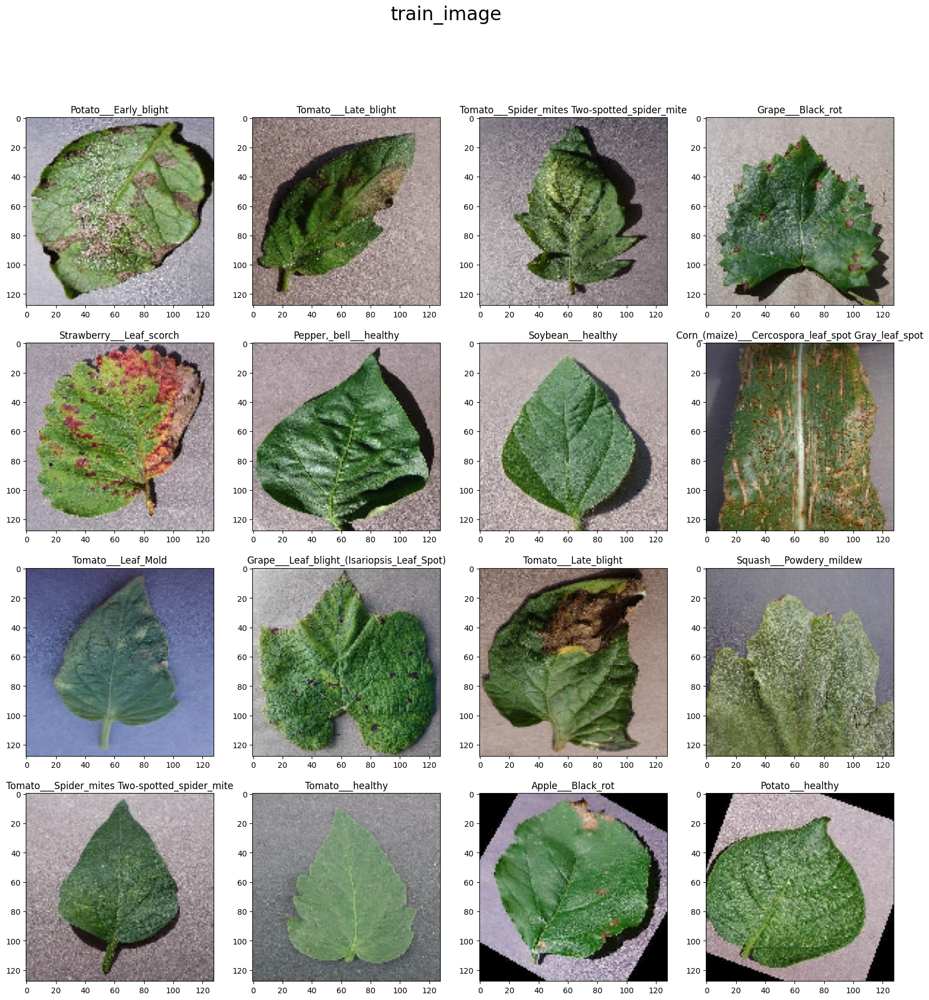

In [ ]:
show_image(train,'train_image')

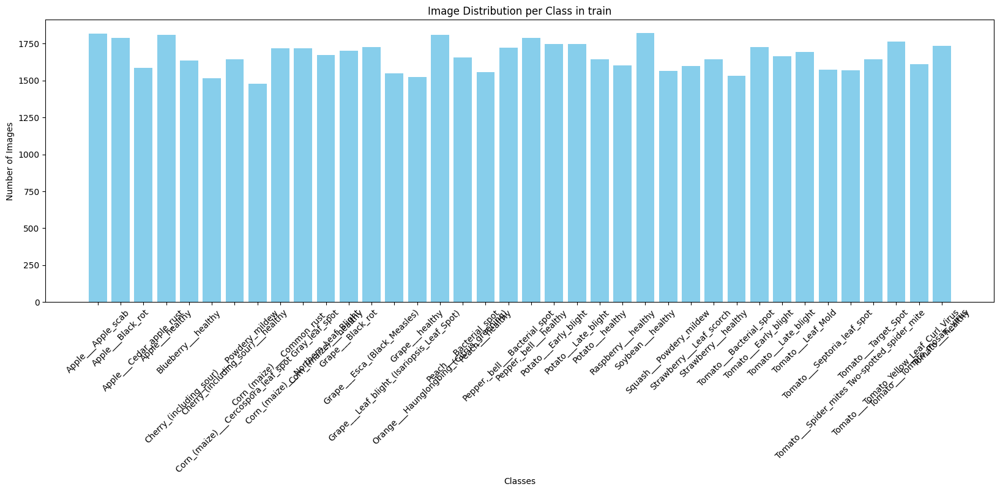

In [ ]:
plot_class_distribution(train,'Image Distribution per Class in train')

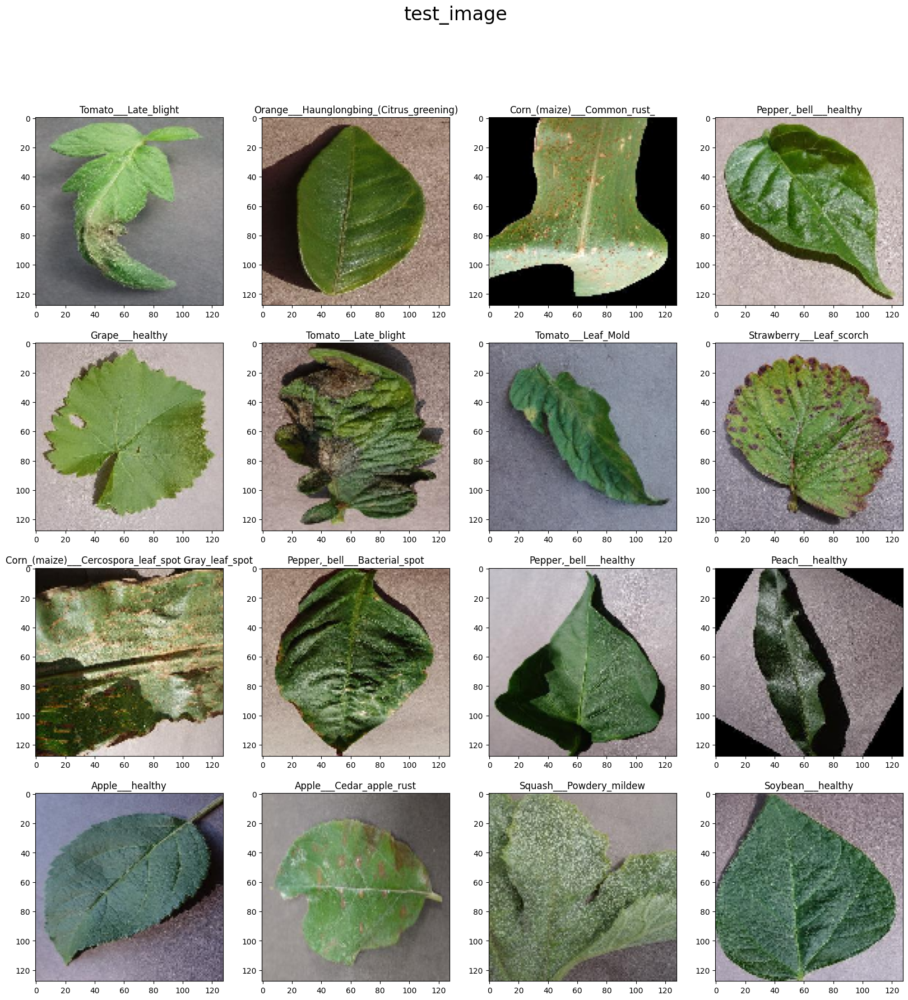

In [ ]:
show_image(test,'test_image')

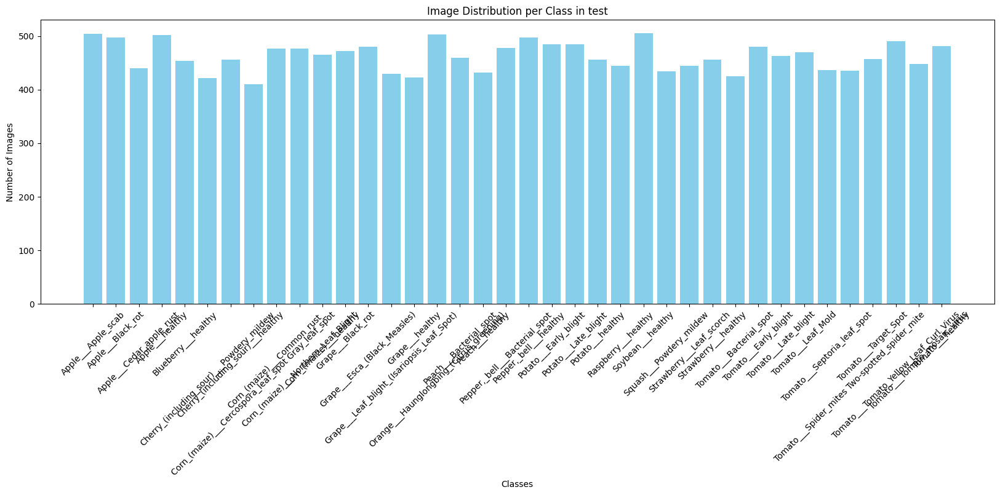

In [ ]:
plot_class_distribution(test,'Image Distribution per Class in test')

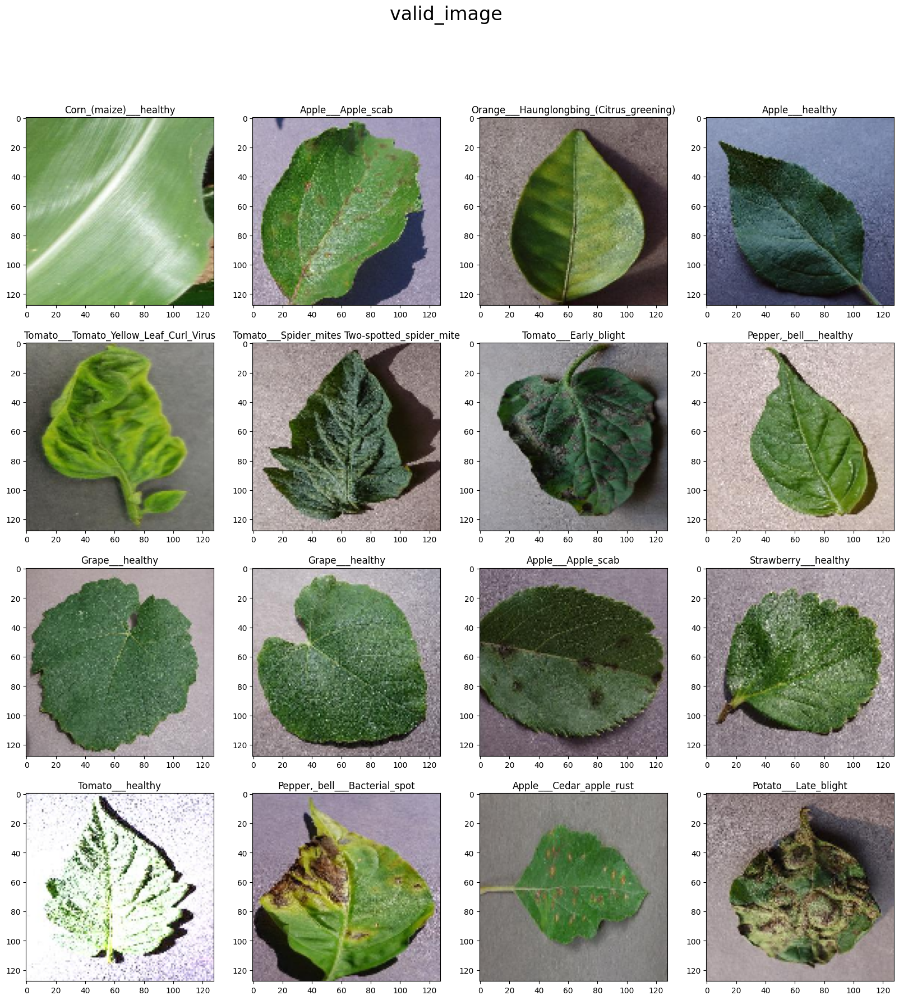

In [ ]:
show_image(valid,'valid_image')

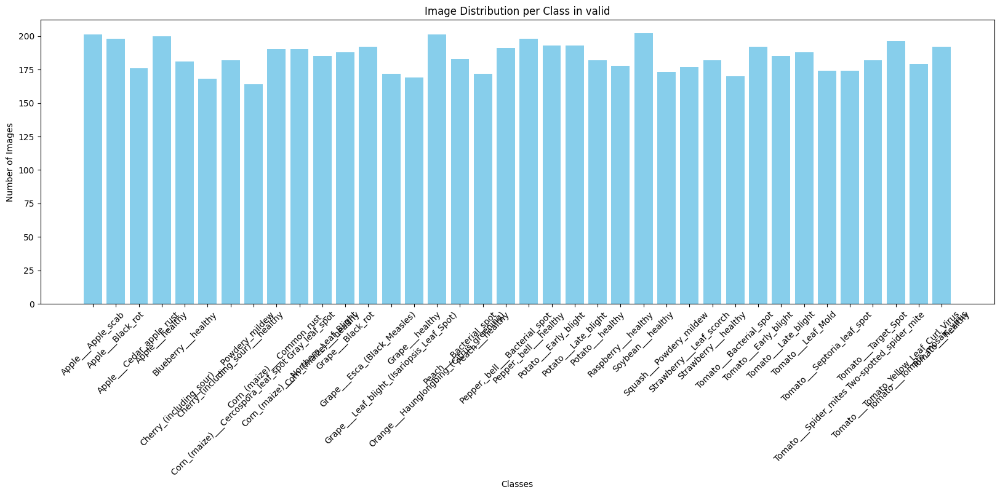

In [ ]:
plot_class_distribution(valid,'Image Distribution per Class in valid')

In [ ]:
pretrained = MobileNetV2(
    input_shape=(128, 128, 3),
    weights='imagenet',
    include_top=False
)
pretrained.trainable = False

model_mobil = Sequential()
model_mobil.add(pretrained)
model_mobil.add(GlobalAvgPool2D())
model_mobil.add(Dense(38, activation="softmax", name="Output"))
optimizer = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)

model_mobil.compile(loss="categorical_crossentropy", optimizer= optimizer, metrics=["accuracy",'precision','recall'])


In [ ]:
dummy_input = np.random.rand(1, 128,128, 3)
model_mobil.predict(dummy_input)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


array([[4.73496178e-03, 1.28035274e-04, 6.34921715e-03, 8.57042894e-03,
        3.37774376e-03, 5.43137686e-03, 5.59508651e-02, 1.42034395e-02,
        1.63454283e-02, 3.48612480e-03, 1.36511389e-03, 1.01287654e-02,
        7.35352421e-03, 2.45165620e-02, 7.35396170e-04, 2.39598658e-02,
        2.33026072e-02, 5.66405430e-03, 6.69735949e-03, 1.89239567e-03,
        3.24481458e-04, 7.21720234e-03, 3.84856993e-03, 1.62277557e-03,
        1.17820036e-03, 1.57540012e-03, 1.58055238e-02, 2.21574962e-01,
        2.37591751e-03, 3.01956743e-01, 5.23160910e-03, 1.63635053e-02,
        1.93581246e-02, 1.40136229e-02, 1.14603667e-02, 4.72803414e-02,
        2.22530053e-03, 1.02394134e-01]], dtype=float32)

In [ ]:
model_mobil.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128 (Functional)    │ (1, 4, 4, 1280)             │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (1, 1280)                   │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Output (Dense)                       │ (1, 38)                     │          48,678 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,306,662 (8.80 MB)

 Trainable params: 48,678 (190.15 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model_mobil.keras', monitor='val_loss', save_best_only=True)

model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=15, min_lr=0.000001)

callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]

In [ ]:
# Training the model
history = model_mobil.fit(train,
                    epochs= 10,
                    batch_size=32,
                    validation_data = valid,
                    callbacks = callbacks
                    )


Epoch 1/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 111s 28ms/step - accuracy: 0.9150 - loss: 0.2740 - precision: 0.9443 - recall: 0.8870 - val_accuracy: 0.9241 - val_loss: 0.2317 - val_precision: 0.9408 - val_recall: 0.9089 - learning_rate: 0.0010
Epoch 2/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 101s 25ms/step - accuracy: 0.9499 - loss: 0.1538 - precision: 0.9618 - recall: 0.9380 - val_accuracy: 0.9260 - val_loss: 0.2178 - val_precision: 0.9391 - val_recall: 0.9174 - learning_rate: 0.0010
Epoch 3/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 144s 26ms/step - accuracy: 0.9609 - loss: 0.1174 - precision: 0.9690 - recall: 0.9541 - val_accuracy: 0.9344 - val_loss: 0.2131 - val_precision: 0.9432 - val_recall: 0.9261 - learning_rate: 0.0010
Epoch 4/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 101s 25ms/step - accuracy: 0.9693 - loss: 0.0928 - precision: 0.9749 - recall: 0.9644 - val_accuracy: 0.9214 - val_loss: 0.2611 - val_precision: 0.9290 - val_recall: 0.9149 - learning_rate: 0.0010
Epoch 5/10
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 14

In [ ]:
hist_df = pd.DataFrame(history.history)

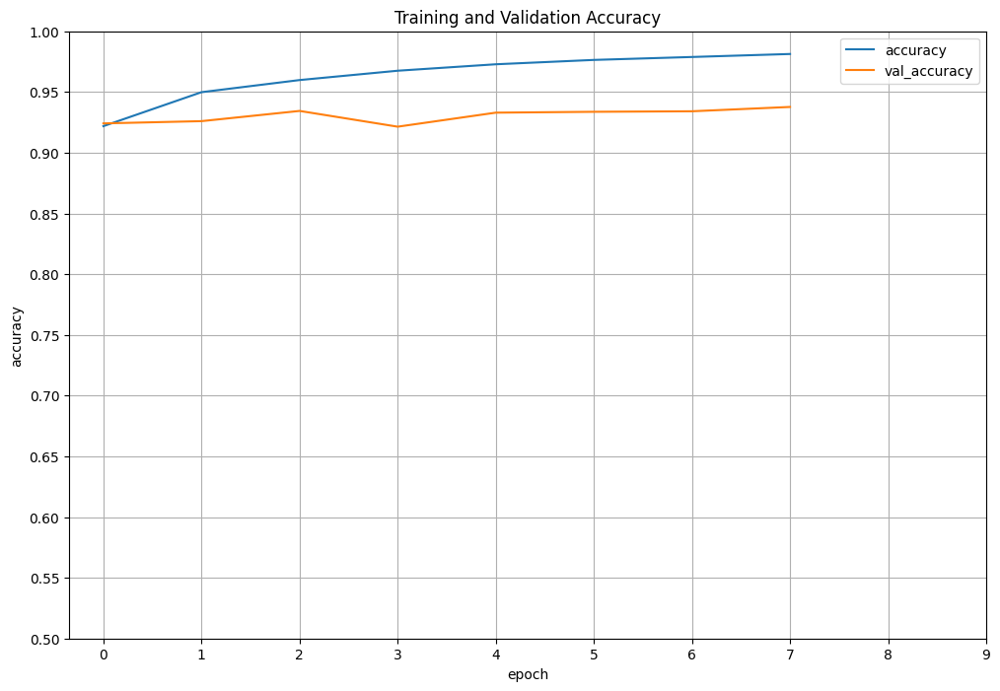

In [ ]:
hist_df.plot(y=['accuracy', 'val_accuracy'], figsize=(12, 8))
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.title('Training and Validation Accuracy')
plt.grid(axis='both')
plt.xticks(np.arange(0, 10, 1))
plt.yticks(np.arange(0.5, 1.01, 0.05))
plt.show()

In [ ]:
train_evaluate = model_mobil.evaluate(train)
test_evaluate = model_mobil.evaluate(test)

3956/3956 ━━━━━━━━━━━━━━━━━━━━ 103s 26ms/step - accuracy: 0.9824 - loss: 0.0568 - precision: 0.9855 - recall: 0.9790
   7/1099 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - accuracy: 0.9719 - loss: 0.0881 - precision: 0.9714 - recall: 0.9487

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1099/1099 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - accuracy: 0.9476 - loss: 0.1682 - precision: 0.9536 - recall: 0.9426


In [ ]:
results = {
    'Model': ['MobileNetV2'],
    'Accuracy train': [train_evaluate[1]],
    'Accuracy test': [test_evaluate[1]],
    'Precision train': [train_evaluate[2]],
    'Precision test': [test_evaluate[2]],
    'Recall train': [train_evaluate[3]],
    'Recall test': [test_evaluate[3]],
}

results_df = pd.DataFrame(results)

results_df

,Model,Accuracy train,Accuracy test,Precision train,Precision test,Recall train,Recall test
0,MobileNetV2,0.981432,0.945481,0.984835,0.951836,0.977972,0.941327


In [ ]:
results_df.to_csv('results.csv', index=False)